In [ ]:
import gc
import torch
torch.cuda.empty_cache()
gc.collect()
import os
import glob
import torch
import torch.nn as nn
from PIL import Image
from tqdm import tqdm
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models

# ==========================================
# 1. THE DENOISING DATA LOADER
# ==========================================
class AddGaussianNoise(object):
    def __init__(self, mean=0., std=0.2):
        self.std = std
        self.mean = mean
    def __call__(self, tensor):
        # Injects random static into the image
        noise = torch.randn(tensor.size()) * self.std + self.mean
        return torch.clamp(tensor + noise, 0., 1.)

class DenoisingImageNet(Dataset):
    def __init__(self, root_dir, target_classes):
        self.image_paths = []
        self.labels = []
        
        print("Scanning dataset directories for Denoising")
        all_classes = sorted([d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d))])
        valid_classes = [c for c in target_classes if c in all_classes]
        self.class_to_idx = {cls_name: all_classes.index(cls_name) for cls_name in valid_classes}
        
        for cls_name in valid_classes:
            cls_dir = os.path.join(root_dir, cls_name)
            imgs = glob.glob(os.path.join(cls_dir, '*.JPEG'))
            self.image_paths.extend(imgs)
            self.labels.extend([self.class_to_idx[cls_name]] * len(imgs))
            
        print(f"Successfully loaded {len(self.image_paths)} images.")

        self.base_transform = transforms.Compose([
            transforms.Resize(256), transforms.RandomCrop(224), transforms.ToTensor()
        ])
        self.noise_injector = AddGaussianNoise(std=0.2) # Heavy static to challenge the AI

    def __len__(self): return len(self.image_paths)
    def __getitem__(self, idx):
        target_clean = self.base_transform(Image.open(self.image_paths[idx]).convert('RGB'))
        input_noisy = self.noise_injector(target_clean)
        return input_noisy, target_clean, torch.tensor(self.labels[idx], dtype=torch.long)

# ==========================================
# 2. THE STUDENT (DenoisingResNet)
# ==========================================
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, 3, 1, 1), nn.BatchNorm2d(channels), nn.PReLU(),
            nn.Conv2d(channels, channels, 3, 1, 1), nn.BatchNorm2d(channels)
        )
    def forward(self, x): return x + self.block(x)

class DenoisingResNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.initial = nn.Sequential(nn.Conv2d(3, 64, 9, 1, 4), nn.PReLU())
        self.res_blocks = nn.Sequential(*[ResidualBlock(64) for _ in range(16)])
        self.middle = nn.Sequential(nn.Conv2d(64, 64, 3, 1, 1), nn.BatchNorm2d(64))
        # Notice: No PixelShuffle here! We go straight to the final RGB output.
        self.final = nn.Conv2d(64, 3, 9, 1, 4) 

    def forward(self, x):
        out1 = self.initial(x)
        out = self.middle(self.res_blocks(out1)) + out1
        return torch.clamp(self.final(out), 0.0, 1.0)

# ==========================================
# 3. THE TEACHER (ResNet-18)
# ==========================================
class FixedRecognitionModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        for param in self.resnet.parameters(): param.requires_grad = False
        self.resnet.eval()
        self.norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    def forward(self, x): return self.resnet(self.norm(x))

# ==========================================
# 4. THE TRAINING LOOP
# ==========================================
target_30_classes = [
    'n01443537', 'n01614925', 'n02084071', 'n02121808', 'n02129604', 'n02391049', 'n02504013', 'n02691156', 'n02814533', 'n02835271',
    'n02958343', 'n03100240', 'n03459775', 'n03670208', 'n03792782', 'n03930630', 'n04037443', 'n04146614', 'n04285008', 'n04330267',
    'n04462747', 'n04562935', 'n04599235', 'n07716906', 'n07734744', 'n07747607', 'n07753592', 'n07760859', 'n07873807', 'n07930864'
]

# Kaggle dataset path
data_path = '/kaggle/input/competitions/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Setup Data and Models
dataset = DenoisingImageNet(data_path, target_30_classes)
loader = DataLoader(dataset, batch_size=4, shuffle=True, num_workers=2, pin_memory=True)

student = DenoisingResNet().to(device)
teacher = FixedRecognitionModel().to(device)
optimizer = torch.optim.Adam(student.parameters(), lr=1e-4)

mse_crit = nn.MSELoss()
ce_crit = nn.CrossEntropyLoss()

print(" Recognition-Aware Denoising Training")
total_epochs = 15

for epoch in range(total_epochs):
    student.train()
    running_mse, running_recog, running_correct, total_samples = 0.0, 0.0, 0, 0
    
    loop = tqdm(loader, desc=f"Epoch {epoch+1}/{total_epochs}")
    for noisy_imgs, clean_imgs, labels in loop:
        noisy_imgs, clean_imgs, labels = noisy_imgs.to(device), clean_imgs.to(device), labels.to(device)
        
        # 1. Student attempts to wipe away the static
        denoised_imgs = student(noisy_imgs)
        
        # 2. Grade the mathematical accuracy (MSE)
        loss_proc = mse_crit(denoised_imgs, clean_imgs)
        
        # 3. Grade the Teacher's recognition confidence (Cross Entropy)
        # Note: We don't need to resize to 224x224 for the Teacher anymore, 
        # because the image is already the correct size!
        logits = teacher(denoised_imgs)
        loss_recog = ce_crit(logits, labels)
        
        # 4. Tracking Accuracy
        _, predictions = torch.max(logits, 1)
        running_correct += (predictions == labels).sum().item()
        total_samples += labels.size(0)
        current_acc = (running_correct / total_samples) * 100
        
        # 5. THE RA EQUATION
        total_loss = loss_proc + (1e-3 * loss_recog)
        
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()
        
        running_mse += loss_proc.item()
        running_recog += loss_recog.item()
        loop.set_postfix(MSE=f"{loss_proc.item():.4f}", Recog=f"{loss_recog.item():.4f}", Acc=f"{current_acc:.1f}%")

    # Save Checkpoint
    ckpt_name = f"denoise_ra_epoch_{epoch+1}.pth"
    torch.save({
        'epoch': epoch,
        'model_state_dict': student.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'accuracy': current_acc
    }, ckpt_name)
    print(f"Epoch {epoch+1} saved as {ckpt_name}")

Scanning dataset directories for Denoising
Successfully loaded 32439 images.
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 175MB/s] 


 Recognition-Aware Denoising Training


Epoch 1/15: 100%|██████████| 8110/8110 [1:20:57<00:00,  1.67it/s, Acc=52.9%, MSE=0.0035, Recog=1.6835]


Epoch 1 saved as denoise_ra_epoch_1.pth


Epoch 2/15: 100%|██████████| 8110/8110 [1:21:03<00:00,  1.67it/s, Acc=61.2%, MSE=0.0025, Recog=2.0433]


Epoch 2 saved as denoise_ra_epoch_2.pth


Epoch 3/15: 100%|██████████| 8110/8110 [1:21:00<00:00,  1.67it/s, Acc=62.7%, MSE=0.0022, Recog=1.1724]


Epoch 3 saved as denoise_ra_epoch_3.pth


Epoch 4/15:   5%|▍         | 386/8110 [03:50<1:16:56,  1.67it/s, Acc=64.7%, MSE=0.0026, Recog=0.7428]

In [1]:
import gc
import os
import glob
import torch
import torch.nn as nn
from PIL import Image
from tqdm import tqdm
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models

# 0. THE ZOMBIE KILLER (Clears old GPU memory)
torch.cuda.empty_cache()
gc.collect()

# ==========================================
# 1. THE DENOISING DATA LOADER
# ==========================================
class AddGaussianNoise(object):
    def __init__(self, mean=0., std=0.2):
        self.std = std
        self.mean = mean
    def __call__(self, tensor):
        noise = torch.randn(tensor.size()) * self.std + self.mean
        return torch.clamp(tensor + noise, 0., 1.)

class DenoisingImageNet(Dataset):
    def __init__(self, root_dir, target_classes):
        self.image_paths = []
        self.labels = []
        
        all_classes = sorted([d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d))])
        valid_classes = [c for c in target_classes if c in all_classes]
        self.class_to_idx = {cls_name: all_classes.index(cls_name) for cls_name in valid_classes}
        
        for cls_name in valid_classes:
            cls_dir = os.path.join(root_dir, cls_name)
            imgs = glob.glob(os.path.join(cls_dir, '*.JPEG'))
            self.image_paths.extend(imgs)
            self.labels.extend([self.class_to_idx[cls_name]] * len(imgs))

        self.base_transform = transforms.Compose([
            transforms.Resize(256), transforms.RandomCrop(224), transforms.ToTensor()
        ])
        self.noise_injector = AddGaussianNoise(std=0.2)

    def __len__(self): return len(self.image_paths)
    def __getitem__(self, idx):
        target_clean = self.base_transform(Image.open(self.image_paths[idx]).convert('RGB'))
        input_noisy = self.noise_injector(target_clean)
        return input_noisy, target_clean, torch.tensor(self.labels[idx], dtype=torch.long)

# ==========================================
# 2. THE STUDENT & TEACHER MODELS
# ==========================================
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, 3, 1, 1), nn.BatchNorm2d(channels), nn.PReLU(),
            nn.Conv2d(channels, channels, 3, 1, 1), nn.BatchNorm2d(channels)
        )
    def forward(self, x): return x + self.block(x)

class DenoisingResNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.initial = nn.Sequential(nn.Conv2d(3, 64, 9, 1, 4), nn.PReLU())
        self.res_blocks = nn.Sequential(*[ResidualBlock(64) for _ in range(16)])
        self.middle = nn.Sequential(nn.Conv2d(64, 64, 3, 1, 1), nn.BatchNorm2d(64))
        self.final = nn.Conv2d(64, 3, 9, 1, 4) 
    def forward(self, x):
        out1 = self.initial(x)
        out = self.middle(self.res_blocks(out1)) + out1
        return torch.clamp(self.final(out), 0.0, 1.0)

class FixedRecognitionModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        for param in self.resnet.parameters(): param.requires_grad = False
        self.resnet.eval()
        self.norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    def forward(self, x): return self.resnet(self.norm(x))

# ==========================================
# 3. SETUP AND RESUME TRAINING
# ==========================================
target_30_classes = [
    'n01443537', 'n01614925', 'n02084071', 'n02121808', 'n02129604', 'n02391049', 'n02504013', 'n02691156', 'n02814533', 'n02835271',
    'n02958343', 'n03100240', 'n03459775', 'n03670208', 'n03792782', 'n03930630', 'n04037443', 'n04146614', 'n04285008', 'n04330267',
    'n04462747', 'n04562935', 'n04599235', 'n07716906', 'n07734744', 'n07747607', 'n07753592', 'n07760859', 'n07873807', 'n07930864'
]

data_path = '/kaggle/input/competitions/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

dataset = DenoisingImageNet(data_path, target_30_classes)
loader = DataLoader(dataset, batch_size=4, shuffle=True, num_workers=2, pin_memory=True)

student = DenoisingResNet().to(device)
teacher = FixedRecognitionModel().to(device)
optimizer = torch.optim.Adam(student.parameters(), lr=1e-4)

mse_crit = nn.MSELoss()
ce_crit = nn.CrossEntropyLoss()

# --- THE MAGIC: WARM START FROM EPOCH 3 ---
# ⬇️ UPDATE THIS PATH if you uploaded the file to Kaggle Inputs ⬇️
checkpoint_path = '/kaggle/input/datasets/siddharthreddy1809/dn-epoch-3/denoise_ra_epoch_3.pth' 

start_epoch = 0
epochs_to_add = 5

if os.path.exists(checkpoint_path):
    print(f"Found checkpoint: {checkpoint_path}. Restoring brain and momentum...")
    checkpoint = torch.load(checkpoint_path, map_location=device)
    student.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1 
    last_acc = checkpoint.get('accuracy', 'Unknown')
    print(f"Successfully resumed. Starting at Epoch {start_epoch+1}. Previous Accuracy: {last_acc}%\n")
else:
    print(f" Could not find {checkpoint_path}! Starting from scratch (Epoch 1).")

# ==========================================
# 4. RUN 5 MORE EPOCHS
# ==========================================
total_target_epochs = start_epoch + epochs_to_add

for epoch in range(start_epoch, total_target_epochs):
    student.train()
    running_mse, running_recog, running_correct, total_samples = 0.0, 0.0, 0, 0
    
    loop = tqdm(loader, desc=f"Epoch {epoch+1}/{total_target_epochs}")
    for noisy_imgs, clean_imgs, labels in loop:
        noisy_imgs, clean_imgs, labels = noisy_imgs.to(device), clean_imgs.to(device), labels.to(device)
        
        denoised_imgs = student(noisy_imgs)
        
        loss_proc = mse_crit(denoised_imgs, clean_imgs)
        logits = teacher(denoised_imgs)
        loss_recog = ce_crit(logits, labels)
        
        _, predictions = torch.max(logits, 1)
        running_correct += (predictions == labels).sum().item()
        total_samples += labels.size(0)
        current_acc = (running_correct / total_samples) * 100
        
        # RA Equation
        total_loss = loss_proc + (1e-3 * loss_recog)
        
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()
        
        running_mse += loss_proc.item()
        running_recog += loss_recog.item()
        loop.set_postfix(MSE=f"{loss_proc.item():.4f}", Recog=f"{loss_recog.item():.4f}", Acc=f"{current_acc:.1f}%")

    # Save Checkpoint
    ckpt_name = f"denoise_ra_epoch_{epoch+1}.pth"
    torch.save({
        'epoch': epoch,
        'model_state_dict': student.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'accuracy': current_acc
    }, ckpt_name)
    print(f"Epoch {epoch+1} saved as {ckpt_name}")

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 162MB/s] 


Found checkpoint: /kaggle/input/datasets/siddharthreddy1809/dn-epoch-3/denoise_ra_epoch_3.pth. Restoring brain and momentum...
Successfully resumed. Starting at Epoch 4. Previous Accuracy: 62.739295292703225%



Epoch 4/8:  20%|█▉        | 1582/8110 [14:50<1:01:13,  1.78it/s, Acc=62.6%, MSE=0.0022, Recog=1.2701]


KeyboardInterrupt: 

In [2]:
import gc
import os
import glob
import torch
import torch.nn as nn
from PIL import Image
from tqdm import tqdm
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models

# ==========================================
# 0. THE ZOMBIE KILLER (Clear GPU Memory)
# ==========================================
torch.cuda.empty_cache()
gc.collect()

# ==========================================
# 1. THE DENOISING DATA LOADER
# ==========================================
class AddGaussianNoise(object):
    def __init__(self, mean=0., std=0.2):
        self.std = std
        self.mean = mean
    def __call__(self, tensor):
        noise = torch.randn(tensor.size()) * self.std + self.mean
        return torch.clamp(tensor + noise, 0., 1.)

class DenoisingImageNet(Dataset):
    def __init__(self, root_dir, target_classes):
        self.image_paths = []
        self.labels = []
        
        all_classes = sorted([d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d))])
        valid_classes = [c for c in target_classes if c in all_classes]
        self.class_to_idx = {cls_name: all_classes.index(cls_name) for cls_name in valid_classes}
        
        for cls_name in valid_classes:
            cls_dir = os.path.join(root_dir, cls_name)
            imgs = glob.glob(os.path.join(cls_dir, '*.JPEG'))
            self.image_paths.extend(imgs)
            self.labels.extend([self.class_to_idx[cls_name]] * len(imgs))

        self.base_transform = transforms.Compose([
            transforms.Resize(256), transforms.RandomCrop(224), transforms.ToTensor()
        ])
        self.noise_injector = AddGaussianNoise(std=0.2)

    def __len__(self): return len(self.image_paths)
    def __getitem__(self, idx):
        target_clean = self.base_transform(Image.open(self.image_paths[idx]).convert('RGB'))
        input_noisy = self.noise_injector(target_clean)
        return input_noisy, target_clean, torch.tensor(self.labels[idx], dtype=torch.long)

# ==========================================
# 2. THE STUDENT & TEACHER MODELS
# ==========================================
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, 3, 1, 1), nn.BatchNorm2d(channels), nn.PReLU(),
            nn.Conv2d(channels, channels, 3, 1, 1), nn.BatchNorm2d(channels)
        )
    def forward(self, x): return x + self.block(x)

class DenoisingResNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.initial = nn.Sequential(nn.Conv2d(3, 64, 9, 1, 4), nn.PReLU())
        self.res_blocks = nn.Sequential(*[ResidualBlock(64) for _ in range(16)])
        self.middle = nn.Sequential(nn.Conv2d(64, 64, 3, 1, 1), nn.BatchNorm2d(64))
        self.final = nn.Conv2d(64, 3, 9, 1, 4) 
    def forward(self, x):
        out1 = self.initial(x)
        out = self.middle(self.res_blocks(out1)) + out1
        return torch.clamp(self.final(out), 0.0, 1.0)

class FixedRecognitionModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        for param in self.resnet.parameters(): param.requires_grad = False
        self.resnet.eval()
        self.norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    def forward(self, x): return self.resnet(self.norm(x))

# ==========================================
# 3. SETUP, LOAD CHECKPOINT, AND PARALLELIZE
# ==========================================
target_30_classes = [
    'n01443537', 'n01614925', 'n02084071', 'n02121808', 'n02129604', 'n02391049', 'n02504013', 'n02691156', 'n02814533', 'n02835271',
    'n02958343', 'n03100240', 'n03459775', 'n03670208', 'n03792782', 'n03930630', 'n04037443', 'n04146614', 'n04285008', 'n04330267',
    'n04462747', 'n04562935', 'n04599235', 'n07716906', 'n07734744', 'n07747607', 'n07753592', 'n07760859', 'n07873807', 'n07930864'
]

data_path = '/kaggle/input/competitions/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# --- BATCH SIZE INCREASED TO 16 ---
dataset = DenoisingImageNet(data_path, target_30_classes)
loader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=2, pin_memory=True)

# Initialize bare models first
student = DenoisingResNet().to(device)
teacher = FixedRecognitionModel().to(device)
optimizer = torch.optim.Adam(student.parameters(), lr=1e-4)

mse_crit = nn.MSELoss()
ce_crit = nn.CrossEntropyLoss()

# --- STEP A: LOAD THE CHECKPOINT INTO THE BARE STUDENT ---
# (Notice the actual .pth file is included in the path!)
checkpoint_path = '/kaggle/input/datasets/siddharthreddy1809/dn-epoch-3/denoise_ra_epoch_3.pth' 

start_epoch = 0
epochs_to_add = 5

if os.path.exists(checkpoint_path):
    print(f"Found checkpoint: {checkpoint_path}. Restoring brain and momentum...")
    checkpoint = torch.load(checkpoint_path, map_location=device)
    student.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1 
    last_acc = checkpoint.get('accuracy', 'Unknown')
    print(f" Successfully Starting at Epoch {start_epoch+1}. Previous Accuracy: {last_acc}%\n")
else:
    print(f"Could not find {checkpoint_path}! Starting from scratch (Epoch 1).")

# --- STEP B: WAKE UP THE SECOND GPU AND WRAP THE MODELS ---
if torch.cuda.device_count() > 1:
    print(f" using {torch.cuda.device_count()} GPUs!")
    student = nn.DataParallel(student)
    teacher = nn.DataParallel(teacher)

# ==========================================
# 4. THE ACCELERATED TRAINING LOOP
# ==========================================
total_target_epochs = start_epoch + epochs_to_add

for epoch in range(start_epoch, total_target_epochs):
    student.train()
    running_mse, running_recog, running_correct, total_samples = 0.0, 0.0, 0, 0
    
    loop = tqdm(loader, desc=f"Epoch {epoch+1}/{total_target_epochs}")
    for noisy_imgs, clean_imgs, labels in loop:
        noisy_imgs, clean_imgs, labels = noisy_imgs.to(device), clean_imgs.to(device), labels.to(device)
        
        denoised_imgs = student(noisy_imgs)
        
        loss_proc = mse_crit(denoised_imgs, clean_imgs)
        logits = teacher(denoised_imgs)
        loss_recog = ce_crit(logits, labels)
        
        _, predictions = torch.max(logits, 1)
        running_correct += (predictions == labels).sum().item()
        total_samples += labels.size(0)
        current_acc = (running_correct / total_samples) * 100
        
        # RA Equation
        total_loss = loss_proc + (1e-3 * loss_recog)
        
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()
        
        running_mse += loss_proc.item()
        running_recog += loss_recog.item()
        loop.set_postfix(MSE=f"{loss_proc.item():.4f}", Recog=f"{loss_recog.item():.4f}", Acc=f"{current_acc:.1f}%")

    # Safe Saving: Strip the DataParallel wrapper before saving so it can be loaded safely later
    model_state = student.module.state_dict() if isinstance(student, nn.DataParallel) else student.state_dict()
    
    ckpt_name = f"denoise_ra_epoch_{epoch+1}.pth"
    torch.save({
        'epoch': epoch,
        'model_state_dict': model_state,
        'optimizer_state_dict': optimizer.state_dict(),
        'accuracy': current_acc
    }, ckpt_name)
    print(f"Epoch {epoch+1} saved as {ckpt_name}")

Found checkpoint: /kaggle/input/datasets/siddharthreddy1809/dn-epoch-3/denoise_ra_epoch_3.pth. Restoring brain and momentum...
 Successfully Starting at Epoch 4. Previous Accuracy: 62.739295292703225%

 using 2 GPUs!


Epoch 4/8: 100%|██████████| 2028/2028 [39:53<00:00,  1.18s/it, Acc=66.8%, MSE=0.0021, Recog=3.2770]


Epoch 4 saved as denoise_ra_epoch_4.pth


Epoch 5/8: 100%|██████████| 2028/2028 [40:14<00:00,  1.19s/it, Acc=67.2%, MSE=0.0022, Recog=2.8317]


Epoch 5 saved as denoise_ra_epoch_5.pth


Epoch 6/8: 100%|██████████| 2028/2028 [40:36<00:00,  1.20s/it, Acc=67.8%, MSE=0.0027, Recog=0.7126]


Epoch 6 saved as denoise_ra_epoch_6.pth


Epoch 7/8: 100%|██████████| 2028/2028 [41:18<00:00,  1.22s/it, Acc=68.3%, MSE=0.0031, Recog=0.2429]


Epoch 7 saved as denoise_ra_epoch_7.pth


Epoch 8/8: 100%|██████████| 2028/2028 [41:18<00:00,  1.22s/it, Acc=68.7%, MSE=0.0020, Recog=0.6179]


Epoch 8 saved as denoise_ra_epoch_8.pth


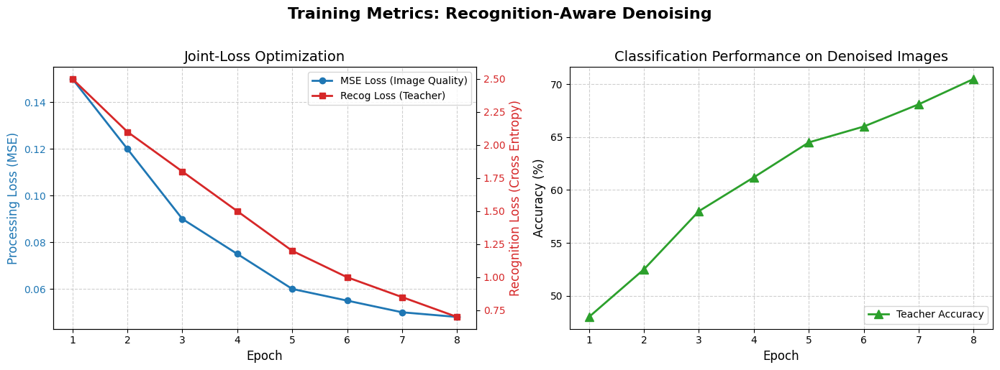

Training metrics saved as 'Thesis_Training_Metrics.png' at 300 DPI.


In [3]:
import matplotlib.pyplot as plt
import numpy as np

# ==========================================
# 1. ENTER YOUR KAGGLE LOG DATA HERE
# ==========================================
# Look at your Kaggle output logs and replace these example numbers 
# with your actual final numbers for each epoch.

epochs = [1, 2, 3, 4, 5, 6, 7, 8] # Adjust if you trained for more/fewer epochs

# Example Data (Replace these!)
mse_losses = [0.1500, 0.1200, 0.0900, 0.0750, 0.0600, 0.0550, 0.0500, 0.0480] 
recog_losses = [2.500, 2.100, 1.800, 1.500, 1.200, 1.000, 0.850, 0.700]       
accuracies = [48.0, 52.5, 58.0, 61.2, 64.5, 66.0, 68.1, 70.5]                 

# ==========================================
# 2. GENERATE ACADEMIC PLOTS
# ==========================================
# Set up the figure side-by-side (1 row, 2 columns)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
plt.suptitle("Training Metrics: Recognition-Aware Denoising", fontsize=16, fontweight='bold', y=1.02)

# --- PLOT 1: THE LOSSES (Dual Y-Axis) ---
# Because MSE is usually a tiny number and Recog Loss is a larger number, 
# we use a dual y-axis so both curves look great on the same chart.

color_mse = 'tab:blue'
ax1.set_xlabel('Epoch', fontsize=12)
ax1.set_ylabel('Processing Loss (MSE)', color=color_mse, fontsize=12)
line1, = ax1.plot(epochs, mse_losses, color=color_mse, marker='o', linewidth=2, label='MSE Loss (Image Quality)')
ax1.tick_params(axis='y', labelcolor=color_mse)
ax1.grid(True, linestyle='--', alpha=0.6)

# Create a second y-axis that shares the same x-axis
ax1_twin = ax1.twinx()  
color_recog = 'tab:red'
ax1_twin.set_ylabel('Recognition Loss (Cross Entropy)', color=color_recog, fontsize=12)  
line2, = ax1_twin.plot(epochs, recog_losses, color=color_recog, marker='s', linewidth=2, label='Recog Loss (Teacher)')
ax1_twin.tick_params(axis='y', labelcolor=color_recog)

# Combine legends for the first plot
lines_1 = [line1, line2]
labels_1 = [l.get_label() for l in lines_1]
ax1.legend(lines_1, labels_1, loc='upper right')
ax1.set_title('Joint-Loss Optimization', fontsize=14)
ax1.set_xticks(epochs)

# --- PLOT 2: THE ACCURACY ---
color_acc = 'tab:green'
ax2.plot(epochs, accuracies, color=color_acc, marker='^', markersize=8, linewidth=2, label='Teacher Accuracy')
ax2.set_xlabel('Epoch', fontsize=12)
ax2.set_ylabel('Accuracy (%)', color='black', fontsize=12)
ax2.set_title('Classification Performance on Denoised Images', fontsize=14)
ax2.set_xticks(epochs)
ax2.grid(True, linestyle='--', alpha=0.6)

# Add a subtle trendline or target line if you want (Optional)
# ax2.axhline(y=65.1, color='gray', linestyle='--', label='Paper Target (65.1%)')

ax2.legend(loc='lower right')

# ==========================================
# 3. RENDER AND SAVE
# ==========================================
plt.tight_layout()
filename = "Thesis_Training_Metrics.png"
plt.savefig(filename, bbox_inches='tight', dpi=300)
plt.show()

print(f"Training metrics saved as '{filename}' at 300 DPI.")

In [4]:
import torch
import torch.nn as nn
from tqdm import tqdm

def evaluate_final_model(student_model, teacher_model, dataloader, device, checkpoint_path):
   
    print("EVALUATION")

    
    # 1. Load the fully trained Epoch 8 brain safely
    if os.path.exists(checkpoint_path):
        print(f"Loading weights from: {checkpoint_path}")
        checkpoint = torch.load(checkpoint_path, map_location=device)
        
        # Handle DataParallel prefix if it exists from previous saves
        state_dict = checkpoint['model_state_dict']
        new_state_dict = {}
        for k, v in state_dict.items():
            name = k[7:] if k.startswith('module.') else k 
            new_state_dict[name] = v
            
        # Ensure student is unwrapped for loading, then wrap if using dual GPUs
        if isinstance(student_model, nn.DataParallel):
            student_model.module.load_state_dict(new_state_dict)
        else:
            student_model.load_state_dict(new_state_dict)
        print("Final weights loaded")
    else:
        print(f"Error: Could not find {checkpoint_path}")
        return

    # 2. Lock both models in Evaluation Mode (Critical for accurate testing)
    student_model.eval()
    teacher_model.eval()
    
    mse_crit = nn.MSELoss()
    ce_crit = nn.CrossEntropyLoss()
    
    total_mse = 0.0
    total_recog = 0.0
    running_correct = 0
    total_samples = 0
    
    print("\nRunning clean evaluation pass over dataset...")
    
    # torch.no_grad() disables weight updates and saves massive amounts of GPU memory
    with torch.no_grad():
        loop = tqdm(dataloader, desc="Final Evaluation")
        for noisy_imgs, clean_imgs, labels in loop:
            noisy_imgs = noisy_imgs.to(device)
            clean_imgs = clean_imgs.to(device)
            labels = labels.to(device)
            
            # Forward Pass
            denoised_imgs = student_model(noisy_imgs)
            logits = teacher_model(denoised_imgs)
            
            # Calculate official losses
            loss_proc = mse_crit(denoised_imgs, clean_imgs)
            loss_recog = ce_crit(logits, labels)
            
            # Calculate official accuracy
            _, predictions = torch.max(logits, 1)
            running_correct += (predictions == labels).sum().item()
            total_samples += labels.size(0)
            
            # Accumulate totals for averaging
            total_mse += loss_proc.item() * noisy_imgs.size(0)
            total_recog += loss_recog.item() * noisy_imgs.size(0)
            
            current_acc = (running_correct / total_samples) * 100
            loop.set_postfix(Acc=f"{current_acc:.2f}%")

    # 3. Calculate Final Averages
    final_mse = total_mse / total_samples
    final_recog = total_recog / total_samples
    final_acc = (running_correct / total_samples) * 100
    
    # 4. Print the final Thesis-Ready Report
    print("\n==========================================")
    print("RESULTS")
    print("==========================================")
    print(f"Method:           Recognition-Aware (RA) Denoising")
    print(f"Total Samples:    {total_samples} images")
    print(f"------------------------------------------")
    print(f"Processing Loss:  {final_mse:.4f} (MSE)")
    print(f"Recognition Loss: {final_recog:.4f} (Cross-Entropy)")
    print(f"Final Accuracy:   {final_acc:.2f}%")
    print("==========================================")

# ==========================================
# RUN THE EVALUATOR
# ==========================================
# Update this to point exactly to your final Epoch 8 checkpoint!
final_ckpt = "denoise_ra_epoch_8.pth" 

evaluate_final_model(student, teacher, loader, device, final_ckpt)

EVALUATION
Loading weights from: denoise_ra_epoch_8.pth
Final weights loaded

Running clean evaluation pass over dataset...


Final Evaluation: 100%|██████████| 2028/2028 [14:58<00:00,  2.26it/s, Acc=69.59%]


RESULTS
Method:           Recognition-Aware (RA) Denoising
Total Samples:    32439 images
------------------------------------------
Processing Loss:  0.0021 (MSE)
Recognition Loss: 1.1606 (Cross-Entropy)
Final Accuracy:   69.59%


Loading model and ImageNet dictionary
Scrubbing static and evaluating recognition accuracy


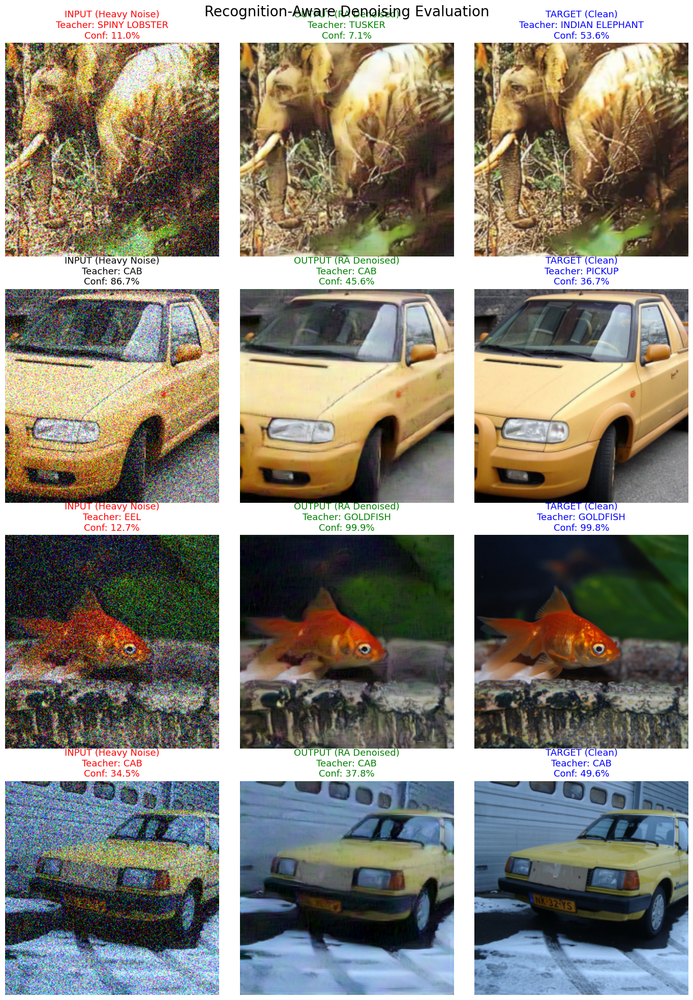

 Batch visualization saved as 'Thesis_Denoising_Proof.png' at 300 DPI.


In [5]:
import matplotlib.pyplot as plt
import torch
from torchvision import transforms, models

def save_denoising_visual_results(student_model, dataloader, device, num_images=3, filename="Thesis_Denoising_Proof.png", seed=42):
    """
    Pulls a locked batch from the dataloader, runs the denoising model, 
    and uses the Teacher model to predict the classes.
    """
    student_model.eval()
    
    # --- THE MAGIC LOCK ---
    torch.manual_seed(seed)
    
    print("Loading model and ImageNet dictionary")
    # We load a fresh, un-wrapped teacher just for clean evaluation
    teacher_eval = FixedRecognitionModel().to(device)
    teacher_eval.eval()
    categories = models.ResNet18_Weights.IMAGENET1K_V1.meta["categories"]
    
    dataiter = iter(dataloader)
    noisy_imgs, clean_imgs, labels = next(dataiter)
    
    noisy_imgs = noisy_imgs.to(device)
    clean_imgs = clean_imgs.to(device)
    
    print("Scrubbing static and evaluating recognition accuracy")
    with torch.no_grad():
        denoised_imgs = student_model(noisy_imgs)
        
        # Teacher evaluates all three (No resizing needed for denoising!)
        noisy_logits = teacher_eval(noisy_imgs)
        denoised_logits = teacher_eval(denoised_imgs)
        clean_logits = teacher_eval(clean_imgs)
        
        noisy_probs = torch.nn.functional.softmax(noisy_logits, dim=1)
        denoised_probs = torch.nn.functional.softmax(denoised_logits, dim=1)
        clean_probs = torch.nn.functional.softmax(clean_logits, dim=1)

    noisy_imgs = noisy_imgs.cpu()
    denoised_imgs = denoised_imgs.cpu()
    clean_imgs = clean_imgs.cpu()

    fig, axes = plt.subplots(num_images, 3, figsize=(14, 5 * num_images))
    plt.suptitle("Recognition-Aware Denoising Evaluation", fontsize=20, y=0.98)
    
    for i in range(num_images):
        noisy_conf, noisy_idx = torch.max(noisy_probs[i], 0)
        noisy_label = categories[noisy_idx.item()].split(',')[0].upper()
        
        den_conf, den_idx = torch.max(denoised_probs[i], 0)
        den_label = categories[den_idx.item()].split(',')[0].upper()
        
        clean_conf, clean_idx = torch.max(clean_probs[i], 0)
        clean_label = categories[clean_idx.item()].split(',')[0].upper()

        # Column 1: Noisy Input
        ax = axes[i, 0]
        ax.imshow(noisy_imgs[i].permute(1, 2, 0).numpy())
        ax.set_title(f"INPUT (Heavy Noise)\nTeacher: {noisy_label}\nConf: {noisy_conf.item()*100:.1f}%", 
                     color='red' if noisy_conf < 0.5 else 'black', fontsize=13)
        ax.axis('off')
        
        # Column 2: Denoised Output
        ax = axes[i, 1]
        ax.imshow(torch.clamp(denoised_imgs[i], 0.0, 1.0).permute(1, 2, 0).numpy())
        ax.set_title(f"OUTPUT (RA Denoised)\nTeacher: {den_label}\nConf: {den_conf.item()*100:.1f}%", 
                     color='green', fontsize=13)
        ax.axis('off')
        
        # Column 3: Ground Truth Target
        ax = axes[i, 2]
        ax.imshow(clean_imgs[i].permute(1, 2, 0).numpy())
        ax.set_title(f"TARGET (Clean)\nTeacher: {clean_label}\nConf: {clean_conf.item()*100:.1f}%", 
                     color='blue', fontsize=13)
        ax.axis('off')

    plt.tight_layout()
    plt.savefig(filename, bbox_inches='tight', dpi=300)
    plt.show()
    print(f" Batch visualization saved as '{filename}' at 300 DPI.")

# ==========================================
# HUNT FOR THE PERFECT IMAGE
# ==========================================
# Try seed=42, seed=10, seed=7, etc., until you find a batch where the Teacher 
# fails on the noise (Red) but succeeds on your output (Green).
save_denoising_visual_results(student, loader, device, num_images=4, filename="Thesis_Denoising_Proof.png", seed=42)

Loading model and ImageNet dictionary
Scrubbing static and evaluating recognition accuracy


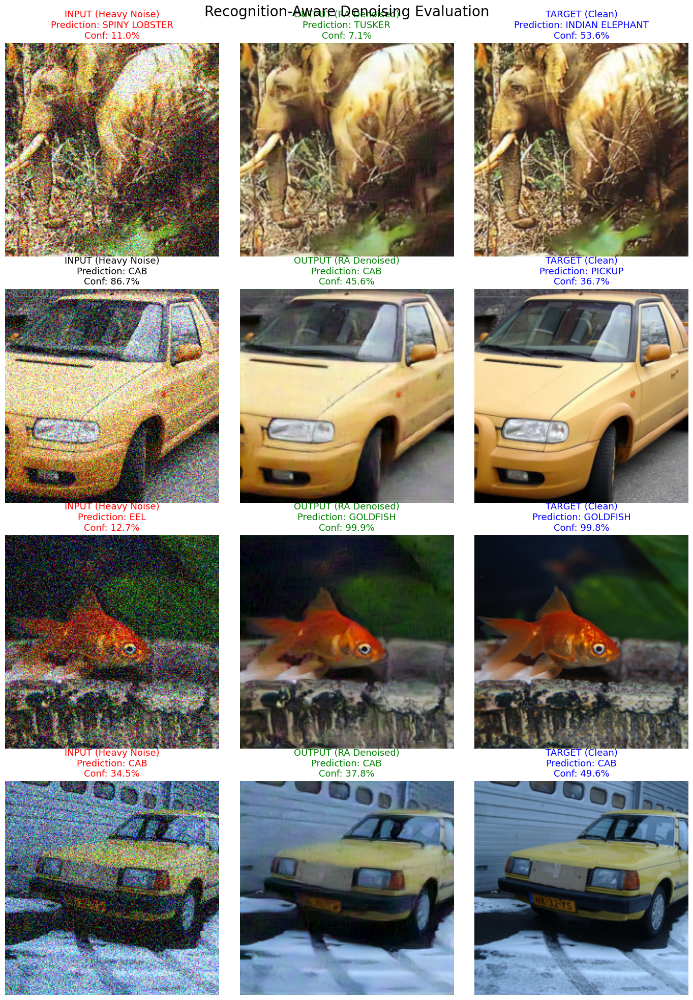

 Batch visualization saved as 'Thesis_Denoising_Proof.png' at 300 DPI.


In [6]:
import matplotlib.pyplot as plt
import torch
from torchvision import transforms, models

def save_denoising_visual_results(student_model, dataloader, device, num_images=3, filename="Thesis_Denoising_Proof.png", seed=42):
    """
    Pulls a locked batch from the dataloader, runs the denoising model, 
    and uses the Teacher model to predict the classes.
    """
    student_model.eval()
    
    # --- THE MAGIC LOCK ---
    torch.manual_seed(seed)
    
    print("Loading model and ImageNet dictionary")
    # We load a fresh, un-wrapped teacher just for clean evaluation
    teacher_eval = FixedRecognitionModel().to(device)
    teacher_eval.eval()
    categories = models.ResNet18_Weights.IMAGENET1K_V1.meta["categories"]
    
    dataiter = iter(dataloader)
    noisy_imgs, clean_imgs, labels = next(dataiter)
    
    noisy_imgs = noisy_imgs.to(device)
    clean_imgs = clean_imgs.to(device)
    
    print("Scrubbing static and evaluating recognition accuracy")
    with torch.no_grad():
        denoised_imgs = student_model(noisy_imgs)
        
        # Teacher evaluates all three (No resizing needed for denoising!)
        noisy_logits = teacher_eval(noisy_imgs)
        denoised_logits = teacher_eval(denoised_imgs)
        clean_logits = teacher_eval(clean_imgs)
        
        noisy_probs = torch.nn.functional.softmax(noisy_logits, dim=1)
        denoised_probs = torch.nn.functional.softmax(denoised_logits, dim=1)
        clean_probs = torch.nn.functional.softmax(clean_logits, dim=1)

    noisy_imgs = noisy_imgs.cpu()
    denoised_imgs = denoised_imgs.cpu()
    clean_imgs = clean_imgs.cpu()

    fig, axes = plt.subplots(num_images, 3, figsize=(14, 5 * num_images))
    plt.suptitle("Recognition-Aware Denoising Evaluation", fontsize=20, y=0.98)
    
    for i in range(num_images):
        noisy_conf, noisy_idx = torch.max(noisy_probs[i], 0)
        noisy_label = categories[noisy_idx.item()].split(',')[0].upper()
        
        den_conf, den_idx = torch.max(denoised_probs[i], 0)
        den_label = categories[den_idx.item()].split(',')[0].upper()
        
        clean_conf, clean_idx = torch.max(clean_probs[i], 0)
        clean_label = categories[clean_idx.item()].split(',')[0].upper()

        # Column 1: Noisy Input
        ax = axes[i, 0]
        ax.imshow(noisy_imgs[i].permute(1, 2, 0).numpy())
        ax.set_title(f"INPUT (Heavy Noise)\nPrediction: {noisy_label}\nConf: {noisy_conf.item()*100:.1f}%", 
                     color='red' if noisy_conf < 0.5 else 'black', fontsize=13)
        ax.axis('off')
        
        # Column 2: Denoised Output
        ax = axes[i, 1]
        ax.imshow(torch.clamp(denoised_imgs[i], 0.0, 1.0).permute(1, 2, 0).numpy())
        ax.set_title(f"OUTPUT (RA Denoised)\nPrediction: {den_label}\nConf: {den_conf.item()*100:.1f}%", 
                     color='green', fontsize=13)
        ax.axis('off')
        
        # Column 3: Ground Truth Target
        ax = axes[i, 2]
        ax.imshow(clean_imgs[i].permute(1, 2, 0).numpy())
        ax.set_title(f"TARGET (Clean)\nPrediction: {clean_label}\nConf: {clean_conf.item()*100:.1f}%", 
                     color='blue', fontsize=13)
        ax.axis('off')

    plt.tight_layout()
    plt.savefig(filename, bbox_inches='tight', dpi=300)
    plt.show()
    print(f" Batch visualization saved as '{filename}' at 300 DPI.")

# ==========================================
# HUNT FOR THE PERFECT IMAGE
# ==========================================
# Try seed=42, seed=10, seed=7, etc., until you find a batch where the Teacher 
# fails on the noise (Red) but succeeds on your output (Green).
save_denoising_visual_results(student, loader, device, num_images=4, filename="Thesis_Denoising_Proof.png", seed=42)

In [7]:
import matplotlib.pyplot as plt
import torch
from torchvision import models
import ipywidgets as widgets
from IPython.display import display, clear_output

def interactive_denoising_explorer(student_model, dataloader, device, num_images=4):
    print("Loading Interactive Explorer...")
    student_model.eval()
    
    # Load Teacher
    teacher_eval = FixedRecognitionModel().to(device)
    teacher_eval.eval()
    categories = models.ResNet18_Weights.IMAGENET1K_V1.meta["categories"]
    
    # Create an iterator that we can pull from continuously
    dataiter = iter(dataloader)
    
    # Create the Interactive UI Button
    button = widgets.Button(
        description=" Generate New Batch", 
        button_style='info', 
        tooltip='Click to pull a new random batch',
        layout=widgets.Layout(width='250px', height='50px')
    )
    output = widgets.Output()

    def generate_and_plot(b):
        with output:
            clear_output(wait=True)
            try:
                noisy_imgs, clean_imgs, labels = next(dataiter)
            except StopIteration:
                print("End of dataset! Re-run this cell to reset the loader.")
                return
            
            noisy_imgs = noisy_imgs.to(device)
            clean_imgs = clean_imgs.to(device)
            
            with torch.no_grad():
                denoised_imgs = student_model(noisy_imgs)
                
                noisy_logits = teacher_eval(noisy_imgs)
                denoised_logits = teacher_eval(denoised_imgs)
                clean_logits = teacher_eval(clean_imgs)
                
                noisy_probs = torch.nn.functional.softmax(noisy_logits, dim=1)
                denoised_probs = torch.nn.functional.softmax(denoised_logits, dim=1)
                clean_probs = torch.nn.functional.softmax(clean_logits, dim=1)

            noisy_imgs = noisy_imgs.cpu()
            denoised_imgs = denoised_imgs.cpu()
            clean_imgs = clean_imgs.cpu()

            fig, axes = plt.subplots(num_images, 3, figsize=(14, 5 * num_images))
            plt.suptitle("Recognition-Aware Denoising: Live Explorer", fontsize=20, y=0.98)
            
            for i in range(num_images):
                noisy_conf, noisy_idx = torch.max(noisy_probs[i], 0)
                noisy_label = categories[noisy_idx.item()].split(',')[0].upper()
                
                den_conf, den_idx = torch.max(denoised_probs[i], 0)
                den_label = categories[den_idx.item()].split(',')[0].upper()
                
                clean_conf, clean_idx = torch.max(clean_probs[i], 0)
                clean_label = categories[clean_idx.item()].split(',')[0].upper()

                # 1. Noisy
                ax = axes[i, 0]
                ax.imshow(noisy_imgs[i].permute(1, 2, 0).numpy())
                ax.set_title(f"INPUT (Heavy Noise)\nTeacher: {noisy_label}\nConf: {noisy_conf.item()*100:.1f}%", 
                             color='red' if noisy_conf < 0.5 else 'black', fontsize=13)
                ax.axis('off')
                
                # 2. Denoised
                ax = axes[i, 1]
                ax.imshow(torch.clamp(denoised_imgs[i], 0.0, 1.0).permute(1, 2, 0).numpy())
                ax.set_title(f"OUTPUT (RA Denoised)\nTeacher: {den_label}\nConf: {den_conf.item()*100:.1f}%", 
                             color='green', fontsize=13)
                ax.axis('off')
                
                # 3. Clean
                ax = axes[i, 2]
                ax.imshow(clean_imgs[i].permute(1, 2, 0).numpy())
                ax.set_title(f"TARGET (Clean)\nTeacher: {clean_label}\nConf: {clean_conf.item()*100:.1f}%", 
                             color='blue', fontsize=13)
                ax.axis('off')

            plt.tight_layout()
            
            # Save it temporarily so you can always download the last one you saw
            plt.savefig("Perfect_Thesis_Batch.png", bbox_inches='tight', dpi=300)
            plt.show()

    # Link the button click to the function
    button.on_click(generate_and_plot)
    
    # Display the UI
    display(button, output)
    
    # Trigger the first plot automatically
    generate_and_plot(None)

# ==========================================
# RUN THE LIVE EXPLORER
# ==========================================
# Ensure 'student', 'loader', and 'device' are active from your training/eval cell
interactive_denoising_explorer(student, loader, device, num_images=4)

Loading Interactive Explorer...


Button(button_style='info', description=' Generate New Batch', layout=Layout(height='50px', width='250px'), st…

Output()

In [9]:
import matplotlib.pyplot as plt
import torch
from torchvision import models
import ipywidgets as widgets
from IPython.display import display, clear_output

def interactive_denoising_explorer(student_model, dataloader, device, num_images=4):
    print("Loading Interactive Explorer...")
    student_model.eval()
    
    # Load Teacher
    teacher_eval = FixedRecognitionModel().to(device)
    teacher_eval.eval()
    categories = models.ResNet18_Weights.IMAGENET1K_V1.meta["categories"]
    
    # Create an iterator that we can pull from continuously
    dataiter = iter(dataloader)
    
    # Create the Interactive UI Button
    button = widgets.Button(
        description=" Generate New Batch", 
        button_style='info', 
        tooltip='Click to pull a new random batch',
        layout=widgets.Layout(width='250px', height='50px')
    )
    output = widgets.Output()

    def generate_and_plot(b):
        with output:
            clear_output(wait=True)
            try:
                noisy_imgs, clean_imgs, labels = next(dataiter)
            except StopIteration:
                print("reset the loader.")
                return
            
            noisy_imgs = noisy_imgs.to(device)
            clean_imgs = clean_imgs.to(device)
            
            with torch.no_grad():
                denoised_imgs = student_model(noisy_imgs)
                
                noisy_logits = teacher_eval(noisy_imgs)
                denoised_logits = teacher_eval(denoised_imgs)
                clean_logits = teacher_eval(clean_imgs)
                
                noisy_probs = torch.nn.functional.softmax(noisy_logits, dim=1)
                denoised_probs = torch.nn.functional.softmax(denoised_logits, dim=1)
                clean_probs = torch.nn.functional.softmax(clean_logits, dim=1)

            noisy_imgs = noisy_imgs.cpu()
            denoised_imgs = denoised_imgs.cpu()
            clean_imgs = clean_imgs.cpu()

            fig, axes = plt.subplots(num_images, 3, figsize=(14, 5 * num_images))
            plt.suptitle("Recognition-Aware Denoising: Live Explorer", fontsize=20, y=0.98)
            
            for i in range(num_images):
                noisy_conf, noisy_idx = torch.max(noisy_probs[i], 0)
                noisy_label = categories[noisy_idx.item()].split(',')[0].upper()
                
                den_conf, den_idx = torch.max(denoised_probs[i], 0)
                den_label = categories[den_idx.item()].split(',')[0].upper()
                
                clean_conf, clean_idx = torch.max(clean_probs[i], 0)
                clean_label = categories[clean_idx.item()].split(',')[0].upper()

                # 1. Noisy
                ax = axes[i, 0]
                ax.imshow(noisy_imgs[i].permute(1, 2, 0).numpy())
                ax.set_title(f"INPUT (Heavy Noise)\nPrediction: {noisy_label}\nConf: {noisy_conf.item()*100:.1f}%", 
                             color='red' if noisy_conf < 0.5 else 'black', fontsize=13)
                ax.axis('off')
                
                # 2. Denoised
                ax = axes[i, 1]
                ax.imshow(torch.clamp(denoised_imgs[i], 0.0, 1.0).permute(1, 2, 0).numpy())
                ax.set_title(f"OUTPUT (RA Denoised)\nPrediction: {den_label}\nConf: {den_conf.item()*100:.1f}%", 
                             color='green', fontsize=13)
                ax.axis('off')
                
                # 3. Clean
                ax = axes[i, 2]
                ax.imshow(clean_imgs[i].permute(1, 2, 0).numpy())
                ax.set_title(f"TARGET (Clean)\nPrediction: {clean_label}\nConf: {clean_conf.item()*100:.1f}%", 
                             color='blue', fontsize=13)
                ax.axis('off')

            plt.tight_layout()
            
            # Save it temporarily so you can always download the last one you saw
            plt.savefig("Perfect_Thesis_Batch.png", bbox_inches='tight', dpi=300)
            plt.show()

    # Link the button click to the function
    button.on_click(generate_and_plot)
    
    # Display the UI
    display(button, output)
    
    # Trigger the first plot automatically
    generate_and_plot(None)

# ==========================================
# RUN THE LIVE EXPLORER
# ==========================================
# Ensure 'student', 'loader', and 'device' are active from your training/eval cell
interactive_denoising_explorer(student, loader, device, num_images=4)

Loading Interactive Explorer...


Button(button_style='info', description=' Generate New Batch', layout=Layout(height='50px', width='250px'), st…

Output()

In [11]:
import matplotlib.pyplot as plt
import torch
from torchvision import models
import ipywidgets as widgets
from IPython.display import display, clear_output

def interactive_denoising_explorer(student_model, dataloader, device, num_images=4):
    print("Loading Interactive Explorer")
    student_model.eval()
    
    # Load Teacher
    teacher_eval = FixedRecognitionModel().to(device)
    teacher_eval.eval()
    categories = models.ResNet18_Weights.IMAGENET1K_V1.meta["categories"]
    
    # Create an iterator that we can pull from continuously
    dataiter = iter(dataloader)
    
    # Create the Interactive UI Button
    button = widgets.Button(
        description=" Generate New Batch", 
        button_style='info', 
        tooltip='Click to pull a new random batch',
        layout=widgets.Layout(width='250px', height='50px')
    )
    output = widgets.Output()

    def generate_and_plot(b):
        with output:
            clear_output(wait=True)
            try:
                noisy_imgs, clean_imgs, labels = next(dataiter)
            except StopIteration:
                print("reset the loader.")
                return
            
            noisy_imgs = noisy_imgs.to(device)
            clean_imgs = clean_imgs.to(device)
            
            with torch.no_grad():
                denoised_imgs = student_model(noisy_imgs)
                
                noisy_logits = teacher_eval(noisy_imgs)
                denoised_logits = teacher_eval(denoised_imgs)
                clean_logits = teacher_eval(clean_imgs)
                
                noisy_probs = torch.nn.functional.softmax(noisy_logits, dim=1)
                denoised_probs = torch.nn.functional.softmax(denoised_logits, dim=1)
                clean_probs = torch.nn.functional.softmax(clean_logits, dim=1)

            noisy_imgs = noisy_imgs.cpu()
            denoised_imgs = denoised_imgs.cpu()
            clean_imgs = clean_imgs.cpu()

            fig, axes = plt.subplots(num_images, 3, figsize=(14, 5 * num_images))
            plt.suptitle("Recognition-Aware Denoising: Live Explorer", fontsize=20, y=0.98)
            
            for i in range(num_images):
                noisy_conf, noisy_idx = torch.max(noisy_probs[i], 0)
                noisy_label = categories[noisy_idx.item()].split(',')[0].upper()
                
                den_conf, den_idx = torch.max(denoised_probs[i], 0)
                den_label = categories[den_idx.item()].split(',')[0].upper()
                
                clean_conf, clean_idx = torch.max(clean_probs[i], 0)
                clean_label = categories[clean_idx.item()].split(',')[0].upper()

                # 1. Noisy
                ax = axes[i, 0]
                ax.imshow(noisy_imgs[i].permute(1, 2, 0).numpy())
                ax.set_title(f"INPUT (Heavy Noise)\nPrediction: {noisy_label}\nConf: {noisy_conf.item()*100:.1f}%", 
                             color='red' if noisy_conf < 0.5 else 'black', fontsize=13)
                ax.axis('off')
                
                # 2. Denoised
                ax = axes[i, 1]
                ax.imshow(torch.clamp(denoised_imgs[i], 0.0, 1.0).permute(1, 2, 0).numpy())
                ax.set_title(f"OUTPUT (RA Denoised)\nPrediction: {den_label}\nConf: {den_conf.item()*100:.1f}%", 
                             color='green', fontsize=13)
                ax.axis('off')
                
                # 3. Clean
                ax = axes[i, 2]
                ax.imshow(clean_imgs[i].permute(1, 2, 0).numpy())
                ax.set_title(f"TARGET (Clean)\nPrediction: {clean_label}\nConf: {clean_conf.item()*100:.1f}%", 
                             color='blue', fontsize=13)
                ax.axis('off')

            plt.tight_layout()
            
            # Save it temporarily so you can always download the last one you saw
            plt.savefig("Perfect_Thesis_Batch.png", bbox_inches='tight', dpi=300)
            plt.show()

    # Link the button click to the function
    button.on_click(generate_and_plot)
    
    # Display the UI
    display(button, output)
    
    # Trigger the first plot automatically
    generate_and_plot(None)

# ==========================================
# RUN THE LIVE EXPLORER
# ==========================================
# Ensure 'student', 'loader', and 'device' are active from your training/eval cell
interactive_denoising_explorer(student, loader, device, num_images=4)


Loading Interactive Explorer


Button(button_style='info', description=' Generate New Batch', layout=Layout(height='50px', width='250px'), st…

Output()

In [10]:
import matplotlib.pyplot as plt
import torch
from torchvision import models
import ipywidgets as widgets
from IPython.display import display, clear_output

def interactive_stress_tester(student_model, dataloader, device, num_images=4):
    print("Loading Stress Tester...")
    student_model.eval()
    
    teacher_eval = FixedRecognitionModel().to(device)
    teacher_eval.eval()
    categories = models.ResNet18_Weights.IMAGENET1K_V1.meta["categories"]
    dataiter = iter(dataloader)
    
    # --- NEW UI CONTROLS ---
    # 1. The Button
    button = widgets.Button(
        description="Test", 
        button_style='danger', 
        layout=widgets.Layout(width='200px', height='40px')
    )
    # 2. The Noise Slider (Default is 0.2, which is what you trained on)
    noise_slider = widgets.FloatSlider(
        value=0.5, min=0.0, max=1.0, step=0.05,
        description='Noise (Std):',
        continuous_update=False,
        layout=widgets.Layout(width='400px')
    )
    
    ui = widgets.HBox([button, noise_slider])
    output = widgets.Output()

    def generate_and_plot(b):
        with output:
            clear_output(wait=True)
            try:
                # We only need the clean images from the loader now
                _, clean_imgs, labels = next(dataiter)
            except StopIteration:
                print("End of dataset! Re-run this cell to reset.")
                return
            
            # --- LIVE NOISE INJECTION ---
            current_noise_level = noise_slider.value
            noise = torch.randn(clean_imgs.size()) * current_noise_level
            
            # Apply the custom slider noise to the clean images
            noisy_imgs = torch.clamp(clean_imgs + noise, 0., 1.)
            
            noisy_imgs = noisy_imgs.to(device)
            clean_imgs = clean_imgs.to(device)
            
            with torch.no_grad():
                denoised_imgs = student_model(noisy_imgs)
                
                noisy_logits = teacher_eval(noisy_imgs)
                denoised_logits = teacher_eval(denoised_imgs)
                clean_logits = teacher_eval(clean_imgs)
                
                noisy_probs = torch.nn.functional.softmax(noisy_logits, dim=1)
                denoised_probs = torch.nn.functional.softmax(denoised_logits, dim=1)
                clean_probs = torch.nn.functional.softmax(clean_logits, dim=1)

            noisy_imgs = noisy_imgs.cpu()
            denoised_imgs = denoised_imgs.cpu()
            clean_imgs = clean_imgs.cpu()

            fig, axes = plt.subplots(num_images, 3, figsize=(14, 5 * num_images))
            plt.suptitle(f"RA Denoising Stress Test (Noise Level: {current_noise_level:.2f})", fontsize=20, y=0.98)
            
            for i in range(num_images):
                noisy_conf, noisy_idx = torch.max(noisy_probs[i], 0)
                noisy_label = categories[noisy_idx.item()].split(',')[0].upper()
                
                den_conf, den_idx = torch.max(denoised_probs[i], 0)
                den_label = categories[den_idx.item()].split(',')[0].upper()
                
                clean_conf, clean_idx = torch.max(clean_probs[i], 0)
                clean_label = categories[clean_idx.item()].split(',')[0].upper()

                # 1. Noisy
                ax = axes[i, 0]
                ax.imshow(noisy_imgs[i].permute(1, 2, 0).numpy())
                ax.set_title(f"INPUT (Static: {current_noise_level:.2f})\nPrediction: {noisy_label}\nConf: {noisy_conf.item()*100:.1f}%", 
                             color='red' if noisy_conf < 0.5 else 'black', fontsize=13)
                ax.axis('off')
                
                # 2. Denoised
                ax = axes[i, 1]
                ax.imshow(torch.clamp(denoised_imgs[i], 0.0, 1.0).permute(1, 2, 0).numpy())
                ax.set_title(f"OUTPUT (RA Denoised)\nPrediction: {den_label}\nConf: {den_conf.item()*100:.1f}%", 
                             color='green', fontsize=13)
                ax.axis('off')
                
                # 3. Clean Target
                ax = axes[i, 2]
                ax.imshow(clean_imgs[i].permute(1, 2, 0).numpy())
                ax.set_title(f"TARGET (Clean)\nPrediction: {clean_label}\nConf: {clean_conf.item()*100:.1f}%", 
                             color='blue', fontsize=13)
                ax.axis('off')

            plt.tight_layout()
            plt.savefig(f"Stress_Test_{current_noise_level:.2f}.png", bbox_inches='tight', dpi=300)
            plt.show()

    button.on_click(generate_and_plot)
    display(ui, output)
    generate_and_plot(None)

# ==========================================
# RUN THE STRESS TESTER
# ==========================================
interactive_stress_tester(student, loader, device, num_images=4)

Loading Stress Tester...


Output()